# Fruchterman-Reingold algorithm
In this notebook, we will implement a version of the Fruchterman-Reingold algorithm just for fun in python. The Fruchterman-Reingold algorithm is a force-directed algorithm for drawing graphs, which positions nodes in a way that visually represents the structure of the graph.

This also demonstrates how to import networkx networks into igraph.

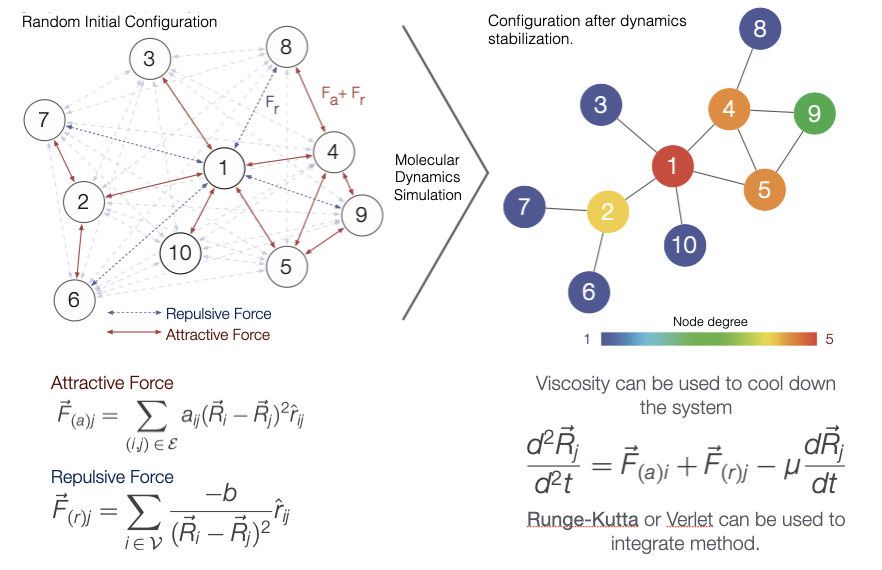

Let's import a few libraries.

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import math
import igraph as ig

from matplotlib.animation import FuncAnimation, writers
%matplotlib widget


Let's create a geographic graph using the networkx library. This can be accomplished using the random_geometric_graph function. A geometric graph is a type of graph where nodes are placed in a geometric space, and edges are formed based on proximity.


In [2]:
#generating a geometric network
network = nx.random_geometric_graph(100,0.2)


Let's convert it to igraph now.

In [3]:
g = ig.Graph.from_networkx(network)


Let's calculate the degrees and get the maximum degree of the graph.
Let's get the number of nodes in the graph and the edges list.

In [4]:

degrees = np.array(g.degree())
maxDegrees = np.max(degrees)
verticesCount = g.vcount()
edges = g.get_edgelist()


Let's define a few parameters for the Fruchterman-Reingold algorithm.

In [5]:
iterations = 500 # number of iterations to run the simulation
viewSize = 50 # size of the view area
viscosity = 0.15 # viscosity coefficient to reduce velocities (like water resistance)
alpha = 0.5 # minimum distance to avoid division by zero in forces calculation
a = 0.001 # coefficient for attractive forces
b = 1.0 # coefficient for repulsive forces
deltaT = 1.0 # time step for each iteration

We can initialize the positions of the nodes randomly according to the viewSize. Let's also initialize the velocities of the nodes to zero.

In [10]:
def resetPositions():
    global positionsX, positionsY, velocitiesX, velocitiesY
    positionsX = viewSize*np.random.random(verticesCount)-viewSize/2.0
    positionsY = viewSize*np.random.random(verticesCount)-viewSize/2.0
    velocitiesX = np.zeros(verticesCount)
    velocitiesY = np.zeros(verticesCount)

resetPositions()


So this is the code that iterates through the nodes and updates their positions based on the forces acting on them. The forces are calculated based on the repulsion between nodes and the attraction between connected nodes.

We are using a very simple Euler integration method to update the positions of the nodes. The positions are updated based on the velocities, and the velocities are updated based on the forces acting on the nodes.

The next position of node $i$ is defined as:

$x_i(t+1) = x_i(t) + v_i(t+1) \Delta t$

where $\Delta t$ is the time step, and $v_i(t)$ is the velocity at time $t$. The velocity is updated based on the forces acting on the nodes, which are calculated based on the repulsion and attraction forces.

First we calculate the total force acting on each node, $F_i(t)$, which is the sum of the repulsion forces from all other nodes and the attraction forces from connected nodes. The repulsion force is inversely proportional to the square of the distance between nodes, while the attraction force is proportional to the distance between connected nodes.

We calculate the velocities as:

$v_i(t+1) = (1-\gamma) v_i(t) + F_i(t+1) \Delta t $

where $\gamma$ is a viscosity factor that reduces the velocity over time to prevent oscillations. The viscosity factor can be set to a small value, such as 0.1.

In [11]:
def iterate(iterationCount):
    global positionsX,positionsY,velocitiesX,velocitiesY
    for iteration in range(iterationCount):
        forcesX = np.zeros(verticesCount)
        forcesY = np.zeros(verticesCount)
        #repulstive forces
        for vertex1 in range(verticesCount):
            for vertex2 in range(vertex1):
                x1 = positionsX[vertex1]
                y1 = positionsY[vertex1]
                x2 = positionsX[vertex2]
                y2 = positionsY[vertex2]
                distance = math.sqrt((x2-x1)*(x2-x1) + (y2-y1)*(y2-y1)) + alpha
                rx = (x2-x1)/distance
                ry = (y2-y1)/distance
                Fx = -b*rx/distance/distance
                Fy = -b*ry/distance/distance
                forcesX[vertex1] += Fx
                forcesY[vertex1] += Fy
                forcesX[vertex2] -= Fx
                forcesY[vertex2] -= Fy
        #attractive forces
        for vFrom,vTo in edges:
            x1 = positionsX[vFrom]
            y1 = positionsY[vFrom]
            x2 = positionsX[vTo]
            y2 = positionsY[vTo]
            distance = math.sqrt((x2-x1)*(x2-x1) + (y2-y1)*(y2-y1))
            Rx = (x2-x1)
            Ry = (y2-y1)
            Fx = a*Rx*distance
            Fy = a*Ry*distance
            forcesX[vFrom] += Fx
            forcesY[vFrom] += Fy
            forcesX[vTo] -= Fx
            forcesY[vTo] -= Fy
            
        # apply forces to velocities
        velocitiesX+=forcesX*deltaT
        velocitiesX*=(1.0-viscosity)
        velocitiesY+=forcesY*deltaT
        velocitiesY*=(1.0-viscosity)
        # update positions
        positionsX += velocitiesX*deltaT
        positionsY += velocitiesY*deltaT


Let's use matplotlib to visualize the graph. We will use the positions calculated by the Fruchterman-Reingold algorithm to draw the graph. We will use animation API to see the graph evolve over time.

In [13]:
from IPython.display import HTML, clear_output
from matplotlib import rc
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import numpy as np

# make sure the JSHTML repr is enabled
rc('animation', html='jshtml')

resetPositions()  # reset positions before starting the animation

def displayEdges(edges, positionsX, positionsY):
    linesX, linesY = [], []
    for u, v in edges:
        fx, fy = positionsX[u], positionsY[u]
        tx, ty = positionsX[v], positionsY[v]
        linesX += [fx, tx, None]
        linesY += [fy, ty, None]
    return linesX, linesY

def animate_graph(edges, positionsX, positionsY, degrees, maxDegrees,
                  viewSize, iterate, framesCount=200):
    # 1) clear previous Jupyter output
    clear_output(wait=True)

    # 2) create a fresh figure/axes
    fig, ax = plt.subplots(figsize=(6,6))
    ax.set_aspect('equal')
    ax.set_xlim(-viewSize, viewSize)
    ax.set_ylim(-viewSize, viewSize)

    # initial drawing
    linesX, linesY = displayEdges(edges, positionsX, positionsY)
    pltEdges,   = ax.plot(linesX, linesY,   linewidth=1, color='#999999')
    pltNodes = ax.scatter(positionsX, positionsY,
                          s=degrees/maxDegrees*100 + 5,
                          c='#222222', zorder=5)

    def update(frame):
        iterate(1)  # advance your simulation
        lx, ly = displayEdges(edges, positionsX, positionsY)
        pltEdges.set_data(lx, ly)
        newPos = np.column_stack((positionsX, positionsY))
        pltNodes.set_offsets(newPos)

        # if your layout grows/shrinks over time:
        ax.set_xlim(min(np.min(positionsX), -viewSize),
                    max(np.max(positionsX),  viewSize))
        ax.set_ylim(min(np.min(positionsY), -viewSize),
                    max(np.max(positionsY),  viewSize))
        return pltEdges, pltNodes  # needed for blitting

    ani = FuncAnimation(fig, update, frames=framesCount,
                        interval=33, blit=True)

    # embed the animation, then close the figure so it won't persist
    display(HTML(ani.to_jshtml()))
    plt.close(fig)

# finally, call it:
animate_graph(edges, positionsX, positionsY,
              degrees, maxDegrees,
              viewSize, iterate, framesCount=200)

Cool right? However this approach is not very efficient for large graphs, as it requires iterating through all pairs of nodes to calculate the forces. For larger graphs, more efficient algorithms such as the Barnes-Hut algorithm. Most of the libraries implementing the Fruchterman-Reingold algorithm use these optimizations to speed up the process.

## Exercises
Create a new version of the forces in which the degrees are part of the forces.